# 1

Load the dataset in memory and explore its head and shape to understand how the informations are placed inside of it

In [24]:
# Impor the data MNIST

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy as sp

data = pd.read_csv("data.csv")

print(data.head())

data = np.array(data)


print(data.shape)


   label  pixel0  pixel1  pixel2  pixel3  pixel4  pixel5  pixel6  pixel7  \
0      1       0       0       0       0       0       0       0       0   
1      0       0       0       0       0       0       0       0       0   
2      1       0       0       0       0       0       0       0       0   
3      4       0       0       0       0       0       0       0       0   
4      0       0       0       0       0       0       0       0       0   

   pixel8  ...  pixel774  pixel775  pixel776  pixel777  pixel778  pixel779  \
0       0  ...         0         0         0         0         0         0   
1       0  ...         0         0         0         0         0         0   
2       0  ...         0         0         0         0         0         0   
3       0  ...         0         0         0         0         0         0   
4       0  ...         0         0         0         0         0         0   

   pixel780  pixel781  pixel782  pixel783  
0         0         0         

# 2

Split the dataset into the X matrix of dimension d × N , with d = 784 being the dimension of each datum, N is the number of datapoints, and Y ∈ RN containing the corresponding label

In [25]:
def img_show(x, y):
    # Matrix visualization
    img = x.reshape((28,28))
    plt.imshow(img, cmap="gray")
    print(f"This is {y}")
# data = data.flatten()
y = data[:, 0].T
x = data[:, 1:].T
print(x.shape)
print(y.shape)

(784, 42000)
(42000,)


# 3
Choose a number of digits (for example, 0, 6 and 9) and extract from X and Y the sub-dataset
containing only the considered digits. Re-call X and Y those datasets, since the originals are not
required anymore;

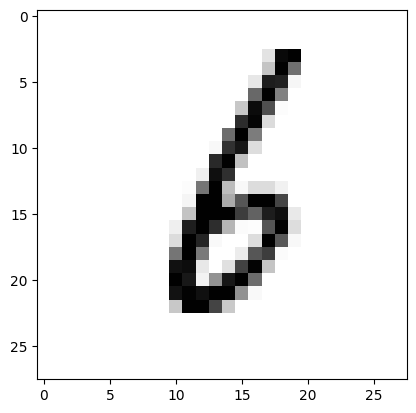

In [26]:
digits = [0, 6, 9]

I1 = (y==0)
I2 = (y==6)
I3 = (y==9)

X1 = x[:, I1]
X2 = x[:, I2]
X3 = x[:, I3]

Y1 = y[I1]
Y2 = y[I2]
Y3 = y[I3]

X = np.concatenate((X1, X2, X3), axis=1)
Y = np.concatenate((Y1, Y2, Y3))
d, N = X.shape

plt.imshow(np.reshape(X2[:, 20], (28,28)), cmap="Greys")


# 4
Set Ntrain < N and randomly sample a training set with Ntrain datapoints from X (and the cor-
responding Y ). Call them Xtrain and Ytrain . Everything else is the test set. Call it Xtest and
Ytest .

(784, 6228) (784, 6229)
This is 6


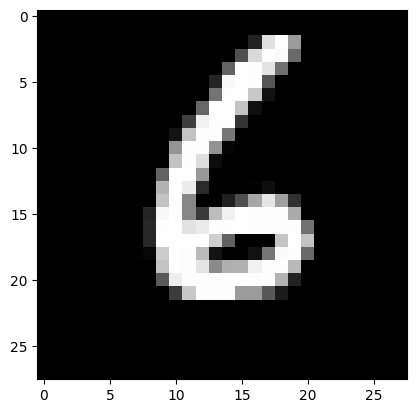

In [27]:

def split(X, Y, Ntrain):
    d, N = X.shape

    idx = np.arange(N)
    np.random.shuffle(idx)

    train_idx = idx[:Ntrain]
    test_idx = idx[Ntrain:]

    Xtrain = X[:, train_idx]
    Ytrain = Y[train_idx]

    Xtest = X[:, test_idx]
    Ytest = Y[test_idx]

    return (Xtrain, Xtest, Ytrain, Ytest) 

Ntrain = int(N / 2)

x_train, x_test, y_train, y_test = split(X, Y, Ntrain)
print(x_train.shape, x_test.shape)
img_show(x_train[:, 0], y_train[0])

# 5
Implement the algorithms computing the PCA and LDA of Xtrain with a fixed k. Visualize the results
(for k = 2) and the position of the centroid of each cluster.

In [28]:
k = 2

def centroid(X):
    centroid = np.mean(X, axis=1)
    centroid = np.reshape(centroid, (len(centroid), 1))
    return centroid


C1 = centroid(X1)
C2 = centroid(X2)
C3 = centroid(X3)



def scatter(Z, y, k, centroids=[], y_centroids=[],xlim=None, ylim=None):
    figure = plt.figure(figsize=(10, 10))
    if k == 3:
        ax = plt.subplot(projection="3d")
    else:
        ax = plt.subplot()
    data = [Z[i, :] for i in range(k)]

    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)

    if len(centroids) != 0:
        centroids = [centroids[i, :] for i in range(k)]
        ax.scatter(*centroids, marker="v", s=150,linewidths = 5, zorder = 10, c="red")
    
    ax.scatter(*data, c=y)

## PCA

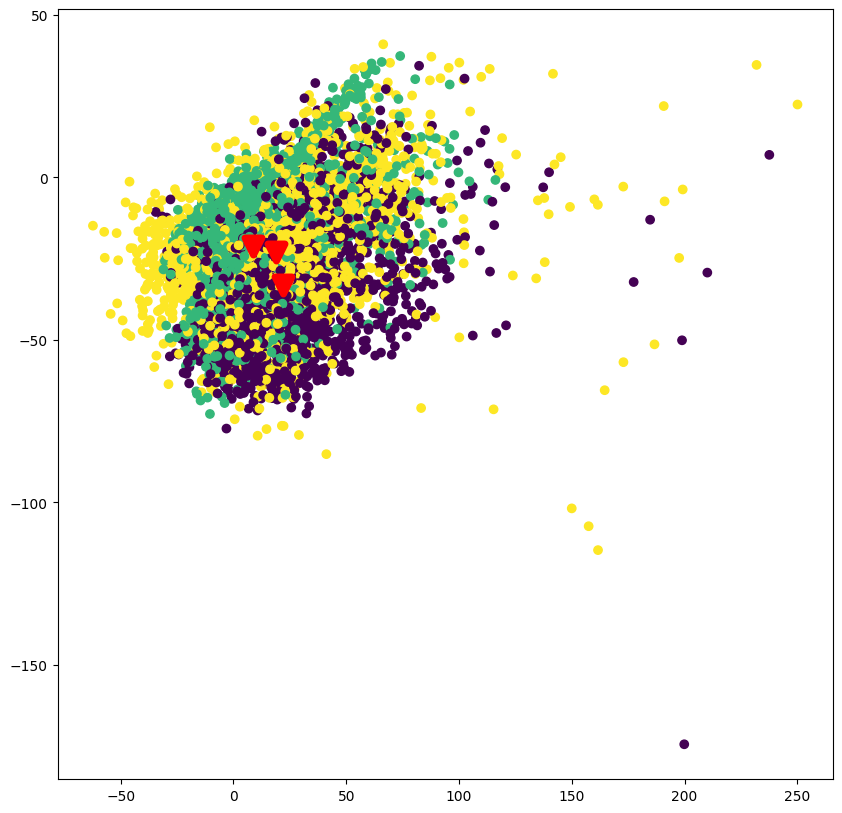

In [29]:
def project(Q, X):
    return np.dot(Q.T, X)


def pca(X, Y, k):

    X_cp = X
    Y_cp = Y
    x_centered = X_cp - centroid(X_cp)

    # Compute svd
    u, s, vh = np.linalg.svd(X_cp, full_matrices=False)

    u_truncated = np.resize(u, (X_cp.shape[0], k))

    centroids = np.concatenate((project(u_truncated, C1), project(u_truncated, C2), project(u_truncated, C3)), axis=1)

    Z = project(u_truncated, X_cp)

    scatter(Z, Y_cp, k, centroids, digits)

    return Z, centroids, u_truncated

Z_pca, C_pca, project_pca = pca(x_train, y_train, k)

## LDA

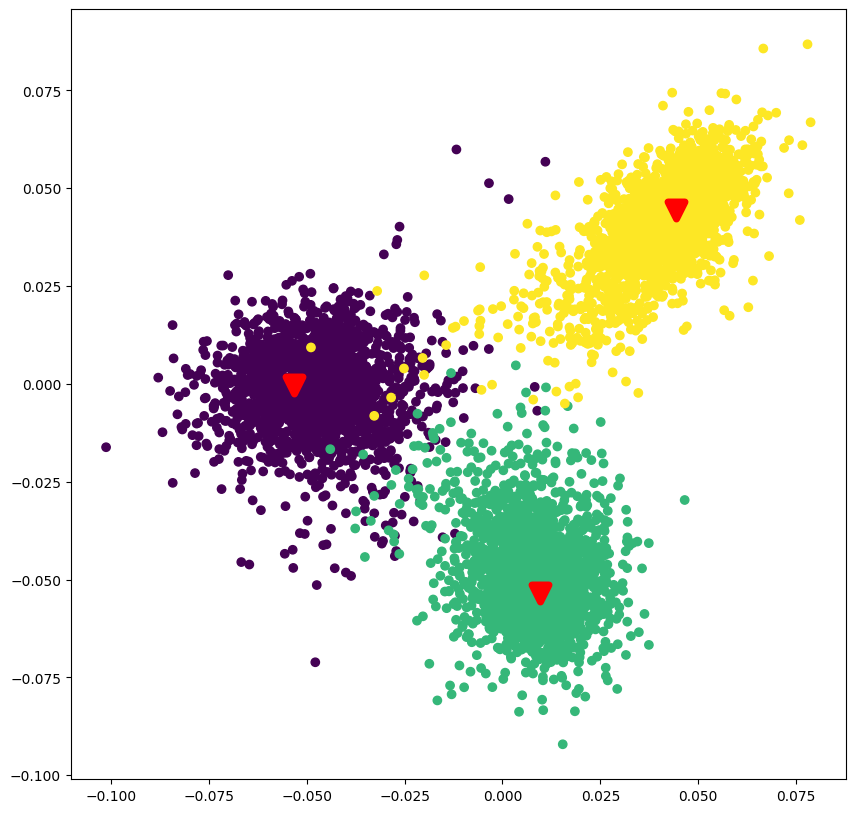

In [30]:
def lda(X, Y, k, digits):
    
    I1 = (Y == digits[0])
    I2 = (Y == digits[1])
    I3 = (Y == digits[2])

    X1 = X[:, I1]
    X2 = X[:, I2]
    X3 = X[:, I3]

    Y1 = Y[I1]
    Y2 = Y[I2]
    Y3 = Y[I3]


    K1 = X1 - C1
    K2 = X2 - C2
    K3 = X3 - C3

    X_conc = np.concatenate((X1, X2, X3), axis=1)
    Y_conc = np.concatenate((Y1, Y2, Y3), axis=0)
    W = np.concatenate((K1, K2, K3), axis=1)
    Sw = W @ W.T


    # Compute Between-clusters Scatter Matrix
    centroids1 = np.full((d, N), C1)
    centroids2 = np.full((d, N), C2)
    centroids3 = np.full((d, N), C3)

    centroids = np.concatenate((centroids1, centroids2, centroids3), axis=1) 
    centroids = centroids - centroid(X_conc)

    Sb = centroids @ centroids.T

    try:
        L = np.linalg.cholesky(Sw)
    except:
        eps = 1e-6
        Sw = Sw + eps*np.identity(len(Sw))
        L = np.linalg.cholesky(Sw)


    eigens, v = sp.sparse.linalg.eigs(np.linalg.inv(L) @ Sb @ L, k=k)
    v = np.real(v)


    #W = np.full((d, k), v)
    Q = np.linalg.inv(L).T @ v

    Z = Q.T @ X_conc

    centroid_projection = np.concatenate((Q.T @ C1, Q.T @ C2, Q.T @ C3), axis=1)

    limits = { "xlim": (-1, 1), "ylim": (-1, 1) }

    scatter(Z, Y_conc, k, centroid_projection, digits)

    return Z, centroid_projection, Q

Z_lda, C_lda, project_lda = lda(x_train, y_train, k, digits)

# 6
For both the algorithms, compute for each cluster the average distance from the centroid. Comment the result;

In [31]:

def distances(Z_lda, Z_pca, C_lda, C_pca, y):

    distance_lda = []
    distance_pca = []

    for i, digit in enumerate(digits):
        distance_lda.append(np.mean(np.linalg.norm(Z_lda[:, (y == digit)].T - C_lda[:, i], axis=1)))
        distance_pca.append(np.mean(np.linalg.norm(Z_pca[:, (y == digit)].T - C_pca[:, i], axis=1)))


    print(f"Average distance lda: {distance_lda}")
    print(f"Average distance pca: {distance_pca}")
    return distance_lda, distance_pca

#Z_lda = project(project_lda, x_train)
distances(Z_lda, Z_pca, C_lda, C_pca, y_train)

Average distance lda: [0.06673553242071126, 0.06397188101998892, 0.07339408003645166]
Average distance pca: [26.43259123664712, 25.08824258555186, 31.10477132492933]


([0.06673553242071126, 0.06397188101998892, 0.07339408003645166],
 [26.43259123664712, 25.08824258555186, 31.10477132492933])

# 7

For both the algorithms, compute for each cluster the average distance from the centroid on the test
set. Comment the results;

In [32]:
x_test_lda = project(project_lda, x_test)
x_test_pca = project(project_pca, x_test)

distances(x_test_lda, x_test_pca, C_lda, C_pca, y_test)

Average distance lda: [0.030302917041754415, 0.029098008827304723, 0.031108870395878886]
Average distance pca: [26.5188292964427, 24.092369393865244, 31.135163353310645]


([0.030302917041754415, 0.029098008827304723, 0.031108870395878886],
 [26.5188292964427, 24.092369393865244, 31.135163353310645])

# 8

Define a classification algorithm in this way: given a new observation x, compute the distance between
x and each cluster centroid. Assign x to the class corresponding the the closer centroid. Compute the
accuracy of this algorithm on the test set and compute its accuracy for both PCA and LDA;

In [33]:
def classify(x, project_lda, project_pca, C_lda, C_pca):
    x_projected_lda = project(project_lda, x)
    x_projected_pca = project(project_pca, x)

    distance_lda = {}
    distance_pca = {}


    for i, digit in enumerate(digits):
        distance_lda[digit] = np.linalg.norm(x_projected_lda-C_lda[:, i])
        distance_pca[digit] = (np.linalg.norm(x_projected_pca-C_pca[:, i]))
    
    min_class_lda = min(distance_lda, key=distance_lda.get)
    min_class_pca = min(distance_pca, key=distance_pca.get)

    return min_class_lda, distance_lda[min_class_lda], min_class_pca, distance_pca[min_class_pca]  

class_lda, _, class_pca, _ = classify(X3[:, 19], project_lda, project_pca, C_lda, C_pca)
print(f"Classified as {class_lda} with lda")
print(f"Classified as {class_pca} with pca")

Classified as 9 with lda
Classified as 9 with pca


In [34]:
def accuracy(X, Y, project_lda, project_pca, C_lda, C_pca):
    d, N = X.shape
    n_right_pca, n_right_lda = 0, 0 
    for i in range(N):
        lda_class, _, pca_class, _ = classify(X[:, i], project_lda, project_pca, C_lda, C_pca)
        n_right_pca = n_right_pca + (1 if pca_class==Y[i] else  0)
        n_right_lda = n_right_lda + (1 if lda_class==Y[i] else 0)
    
    return n_right_lda/N, n_right_pca/N

lda_accuracy, pca_accuracy = accuracy(x_test, y_test, project_lda, project_pca, C_lda, C_pca)

print(f"Accuracy of pca {pca_accuracy}")
print(f"Accuracy of lda {lda_accuracy}")

Accuracy of pca 0.5031305185423022
Accuracy of lda 0.9773639428479691


# 9
Repeat this experiment for different values of k and different digits. What do you observe?

(784, 6446) (784, 6447)
This is 6
Accuracy of pca 0.17853265084535444
Accuracy of lda 0.9778191406855902


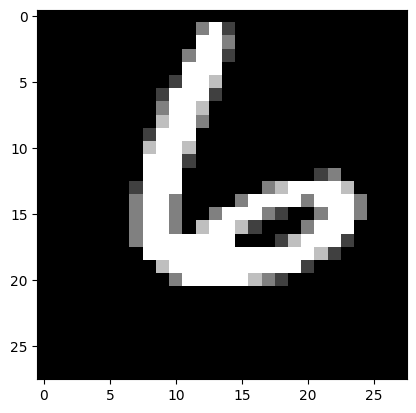

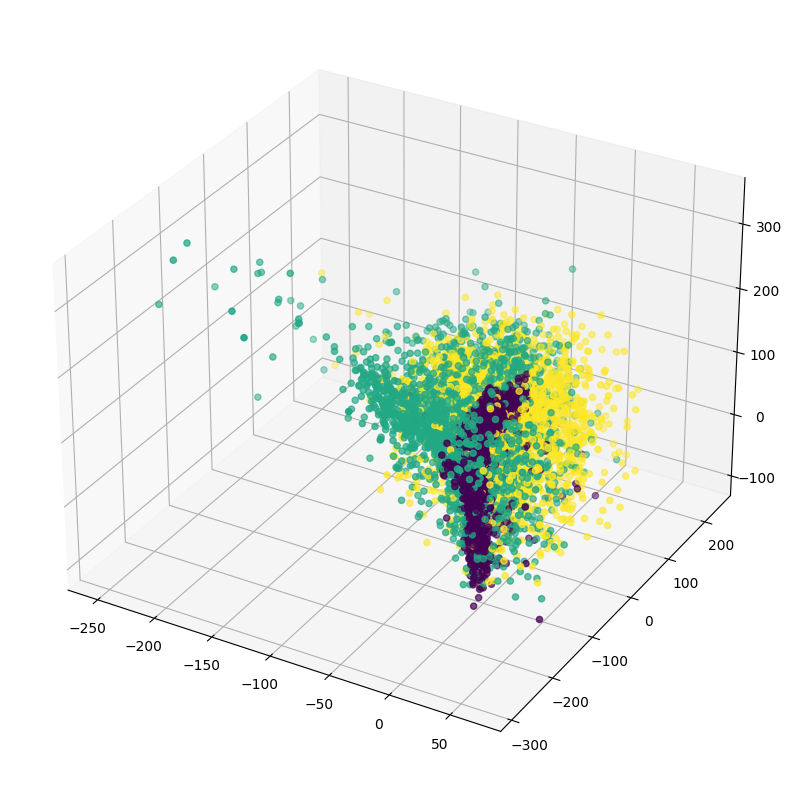

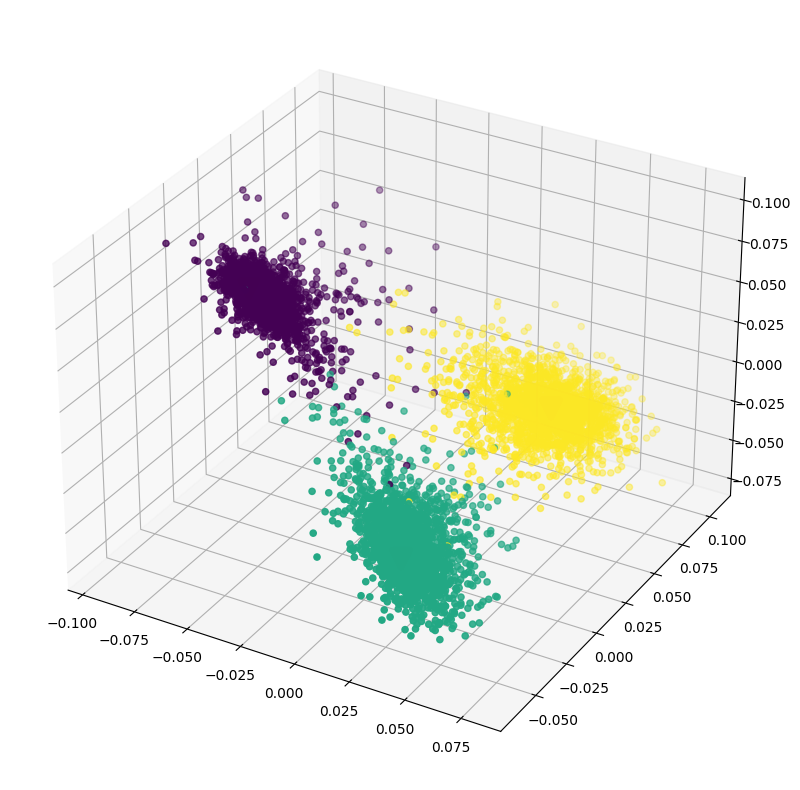

In [35]:
k = 3

digits = [1, 4, 6]

I1 = (y==1)
I2 = (y==4)
I3 = (y==6)

X1 = x[:, I1]
X2 = x[:, I2]
X3 = x[:, I3]

Y1 = y[I1]
Y2 = y[I2]
Y3 = y[I3]

X = np.concatenate((X1, X2, X3), axis=1)
Y = np.concatenate((Y1, Y2, Y3))
d, N = X.shape


Ntrain = int(N / 2)

x_train, x_test, y_train, y_test = split(X, Y, Ntrain)
print(x_train.shape, x_test.shape)
img_show(x_train[:, 0], y_train[0])


Z_pca, C_pca, project_pca = pca(x_train, y_train, k)
Z_lda, C_lda, project_lda = lda(x_train, y_train, k, digits)

lda_accuracy, pca_accuracy = accuracy(x_test, y_test, project_lda, project_pca, C_lda, C_pca)

print(f"Accuracy of pca {pca_accuracy}")
print(f"Accuracy of lda {lda_accuracy}")

# Visualizing dyad
Consider an image from skimage.data. For simplicity, say that X ∈ Rm×n is the matrix representing
that image. You are asked to visualize the dyad of the SVD Decomposition of X and the result of compressing
the image via SVD. In particular:

##  Load the image into memory and compute its SVD;

In [36]:
from skimage import data, io, filters
import numpy as np
import matplotlib.pyplot as plt
import random

img = data.coins()

m, n = img.shape


U, s, vh = np.linalg.svd(img)


## Visualize some of the dyad σi ui viT of this decomposition. What do you notice

In [37]:
def show_img(img, approx, k=None, title=""):
    plt.figure(figsize=(20, 10))

    fig1 = plt.subplot(1, 2, 1)
    fig1.imshow(img, cmap='gray')
    plt.title('True image')

    fig2 = plt.subplot(1, 2, 2)
    fig2.imshow(approx, cmap='gray')
    plt.title(f'{title} {"k = " + str(k) if k is not None else ""}')

    plt.show()

In [38]:
column = 0
random = np.random.randint(0, U.shape[1]-1, 2)

def approximate(U, s, vh, k):
    A_k = np.zeros((m, n))
    for i in range(k):
        u = U[:, i]
        u = u.reshape((u.size, 1))
        v_t = vh.T[:, i]
        v_t = v_t.reshape((1, v_t.size))
        tmp = np.dot(u, v_t) * s[i]
        A_k = A_k + tmp
    return A_k

# show_img(img, approx)

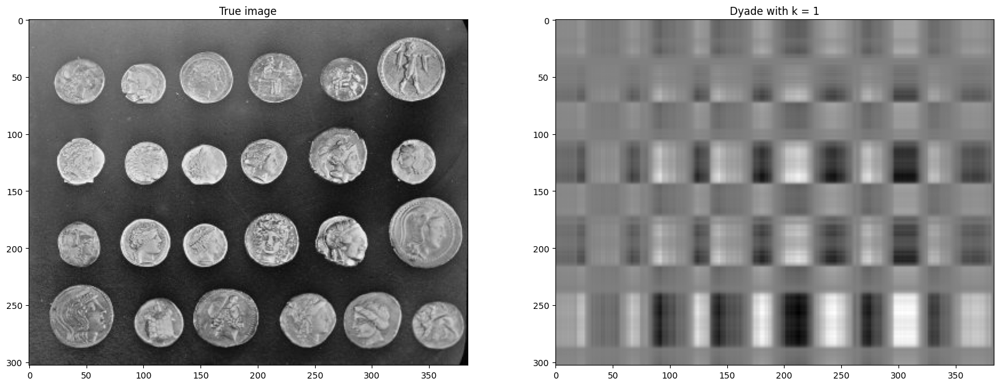

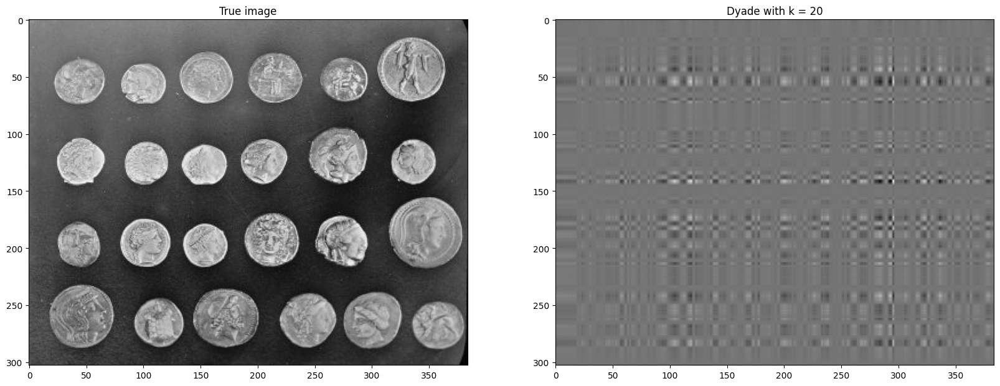

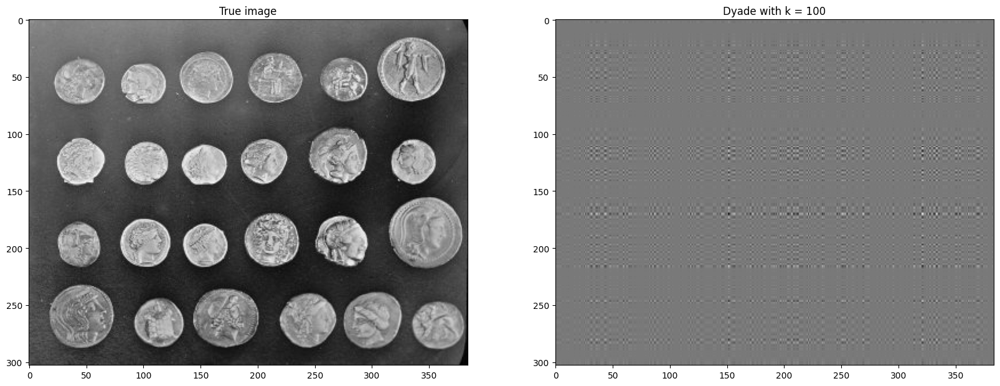

In [39]:
dyads = [1, 20, 100]
for i in dyads:
    u = U[:, i]
    u = u.reshape((u.size, 1))
    v_t = vh.T[:, i]
    v_t = v_t.reshape((1, v_t.size))
    A_k = np.dot(u, v_t) * s[i]
    show_img(img, A_k, i, title="Dyade with")


## Plot the singular values of X. Do you note something?

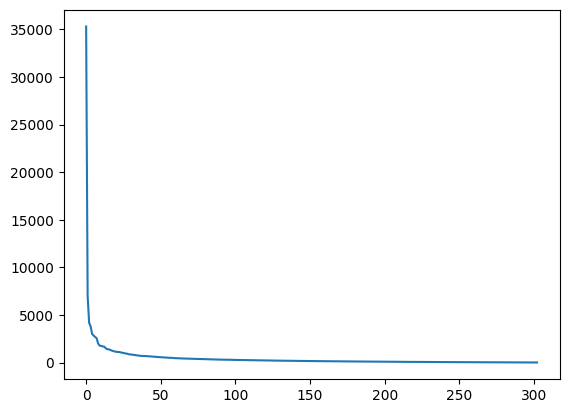

In [40]:
plt.plot(s)

## Visualize the k-rank approximation of X for different values of k. What do you observe?

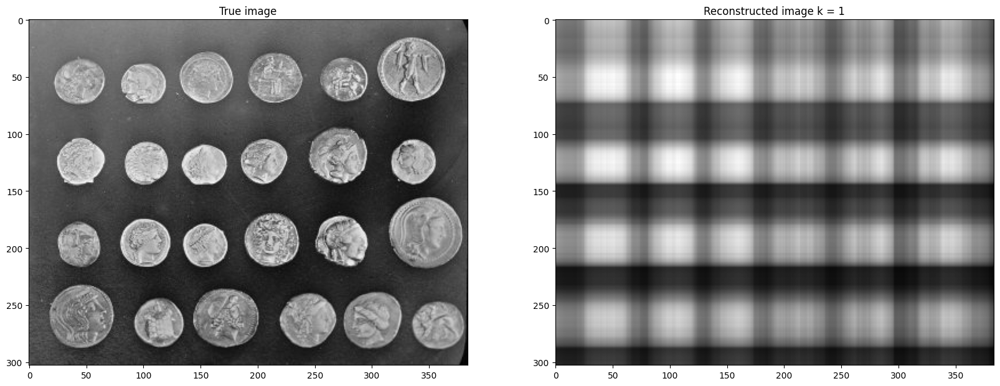

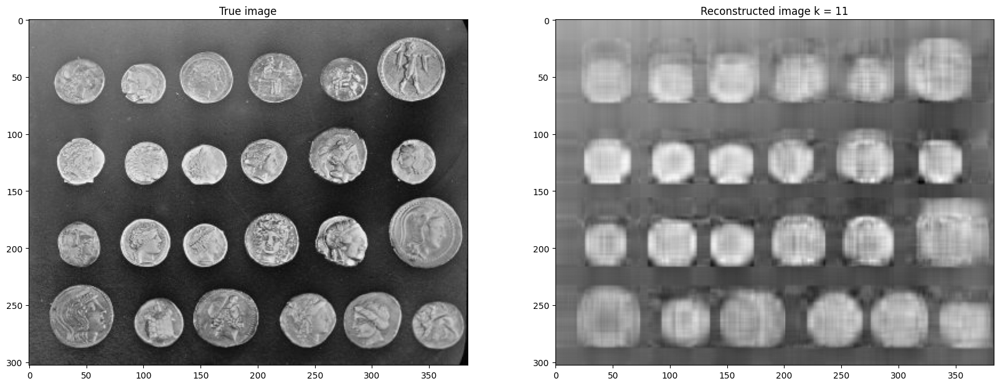

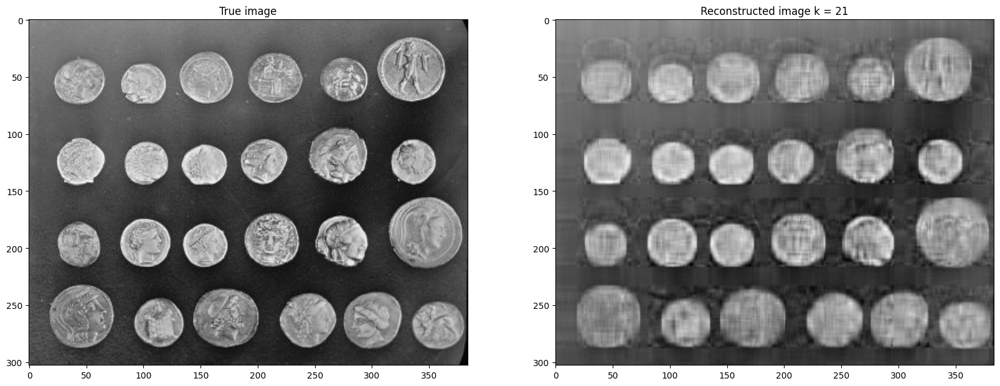

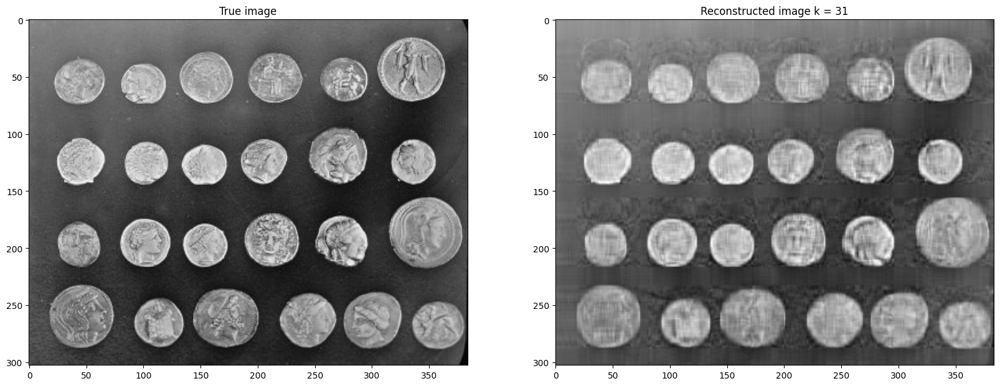

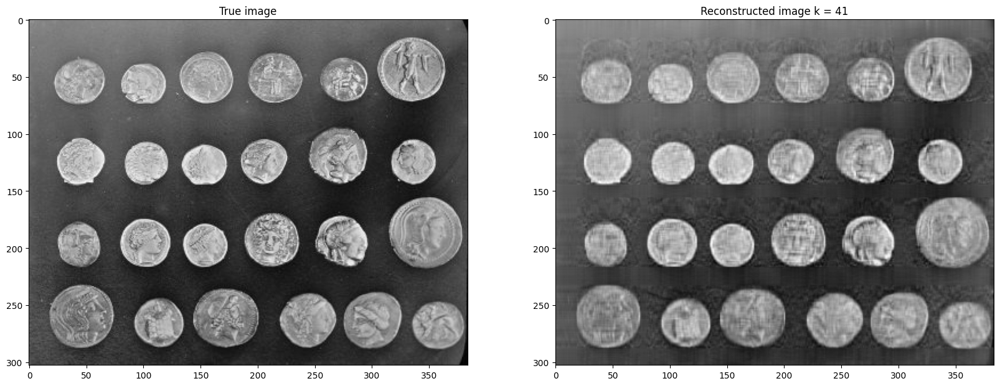

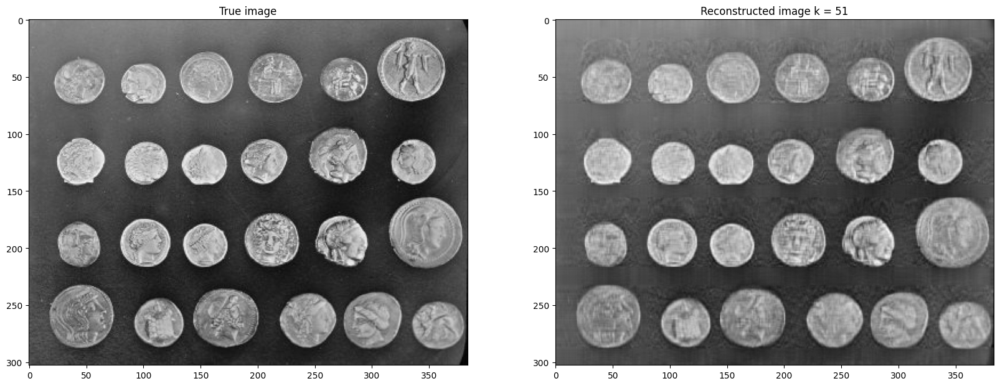

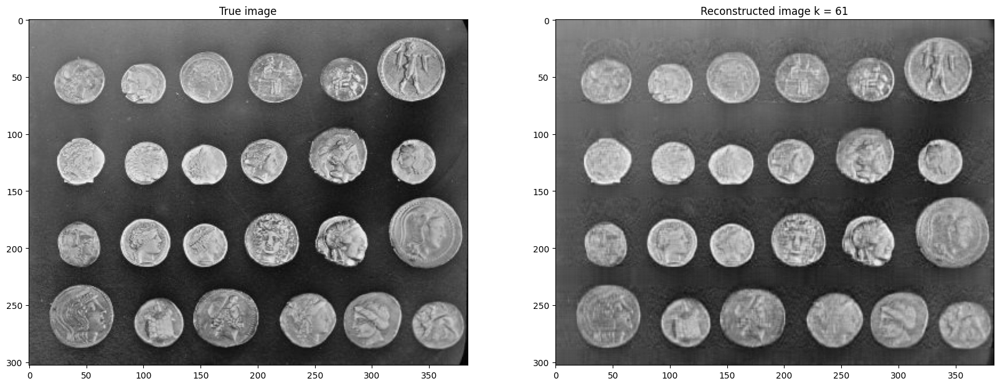

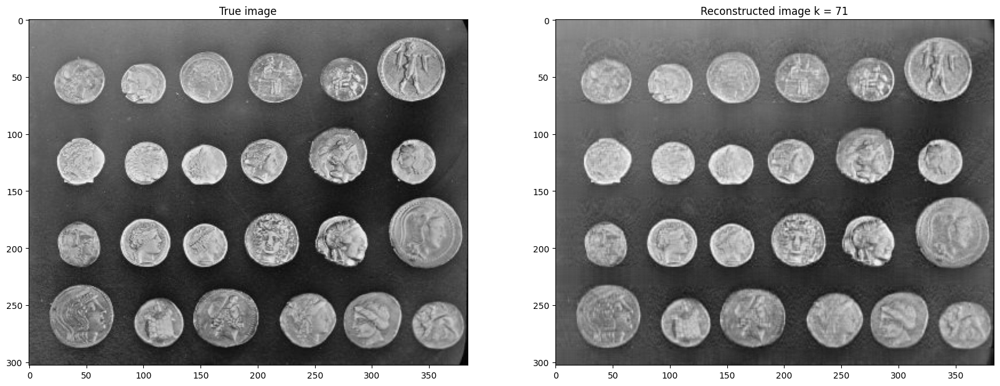

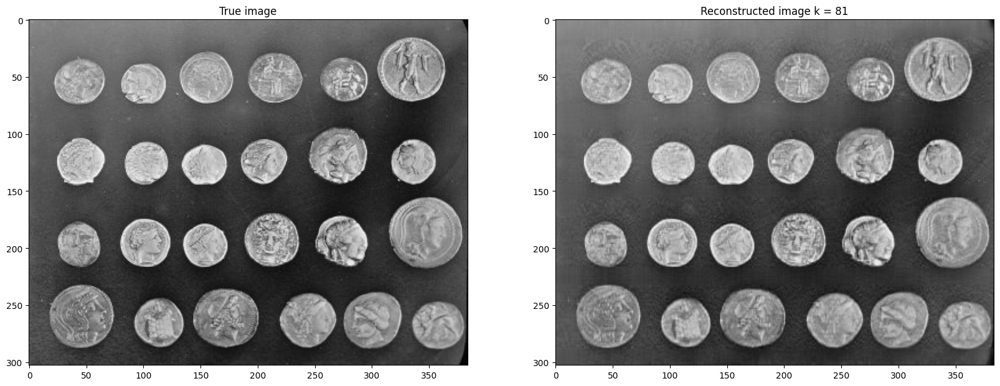

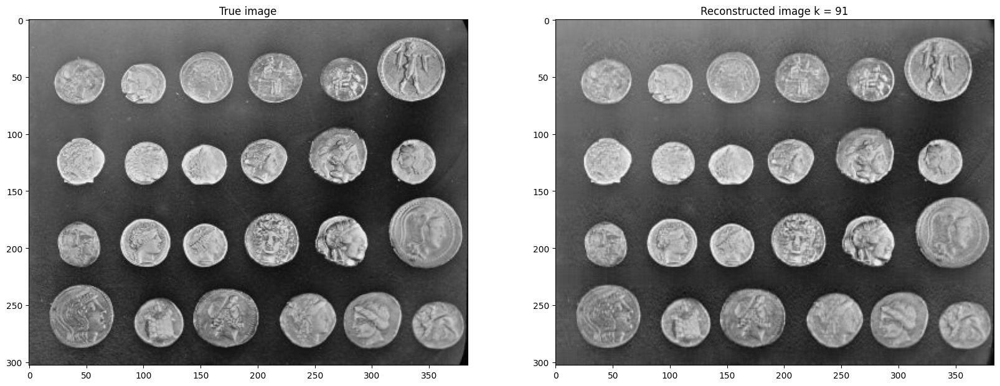

In [41]:
k = 100

for i in range(1, k+1, 10):
    approx = approximate(U, s, vh, i)
    show_img(img, approx, k=i, title="Reconstructed image")

## Compute and plot the approximation error ||X − Xk ||| for increasing values of k, where Xk is the k-rank approximation of k.

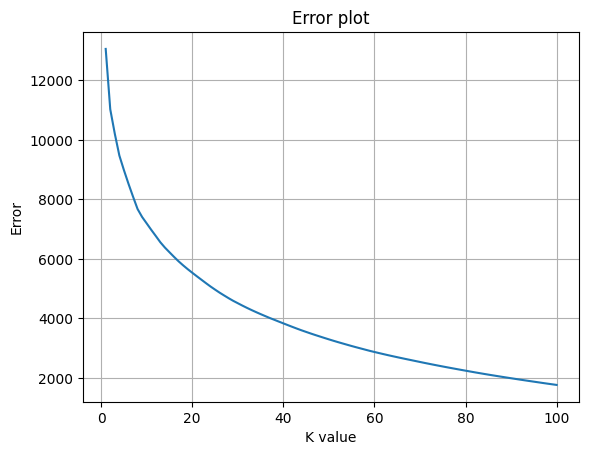

In [42]:
def error(img, approx):
    return np.linalg.norm(img - approx)

k = 100

errors = []
for i in range(1, k+1):
    approx = approximate(U, s, vh, i)
    errors.append(error(img, approx))

def plot_errors(errors):
    plt.title("Error plot")
    x = np.arange(1, len(errors)+1, 1)
    plt.grid()
    plt.xlabel("K value")
    plt.ylabel("Error")
    plt.plot(x, errors)

plot_errors(errors)

## Plot the compression factor $ \frac{k}{mn}$ for increasing k;

Text(0, 0.5, 'Comp. factor')

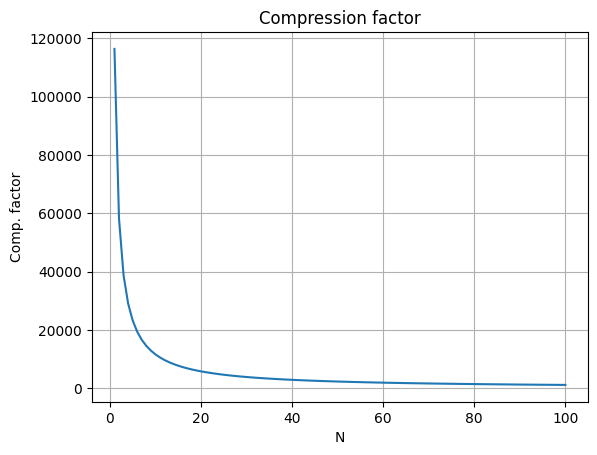

In [43]:

c_factors = []
N = 100

def compression_factor(img, k):
    m, n = img.shape
    return  m*n / k

for i in range(1, N+1):
    approx = approximate(U, s, vh, i)
    c_factors.append(compression_factor(approx, i))

plt.plot(np.arange(1, N+1), c_factors)
plt.title("Compression factor")
plt.grid()
plt.xlabel("N")
plt.ylabel("Comp. factor")